In [1]:
# Import necessary module
import os
from collections import Counter
from pathlib import Path
import random
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2

In [2]:
# Define necessary constant
DATA_DIR = 'datasets/'
TRAIN_DIR = os.path.join(DATA_DIR, 'train')
TEST_DIR = os.path.join(DATA_DIR, 'test')
TRAIN_FILE = os.path.join(DATA_DIR, 'train.csv')

In [3]:
df = pd.read_csv(TRAIN_FILE)
df.head(10)

,id,landmark_id
0,17660ef415d37059,1
1,92b6290d571448f6,1
2,cd41bf948edc0340,1
3,fb09f1e98c6d2f70,1
4,25c9dfc7ea69838d,7
5,28b13f94a6f1f3c1,7
6,307d6584f473ba35,7
7,4a7ba9eb16d51bc4,7
8,597353dfbb3df649,7
9,a40d00dc4fcc3a10,7


In [4]:
print("Total training example: ", str(df.shape[0]))
# Total land mark
print("Total landmark: ", df.landmark_id.unique().shape[0])

Total training example:  1580470
Total landmark:  81313


## Number of occurences

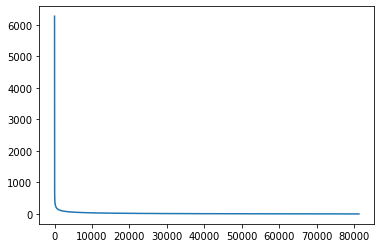

In [5]:
occur = Counter(df.landmark_id).most_common()
sorted_occur = sorted(list(list(zip(*occur))[1]), reverse=True)

plt.plot(list(range(len(sorted_occur))), sorted_occur)

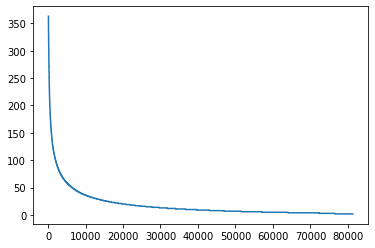

In [6]:
# The lowest appeared landmark isnot that visible in the graph above. Let's remove first few most appeared land mark 
plt.plot(list(range(100, len(sorted_occur))), sorted_occur[100:])

In [7]:
print("# training example for each landmark: ")
print("\t\t\t\t mean: \t ", str(np.mean(sorted_occur)))
print("\t\t\t\t standard devaiation: \t ", str(np.std(sorted_occur)))
print("\t\t\t\t maximum: \t ", str(np.max(sorted_occur)))
print("\t\t\t\t minimum: \t ", str(np.min(sorted_occur)))

# training example for each landmark: 
				 mean: 	  19.436867413574706
				 standard devaiation: 	  42.87722542715034
				 maximum: 	  6272
				 minimum: 	  2


## Visualize

### Utility functions 

In [8]:
# Utility function
def load_image(path):
    img = cv2.imread(path)
    return np.asarray(img)

def get_image_path_from_id(image_id):
    for path in Path(TRAIN_DIR).rglob(image_id+"*"):
        return str(path)
    
def get_random_image_path(num_items, image_ids):
    images_path = []
    while len(images_path) < min(num_items, len(image_ids)):
        image_id = random.choice(image_ids)
        image_path = get_image_path_from_id(image_id)
        if image_path != None:
            images_path.append(image_path)
    return images_path

def show_images(image_ids, num_images=10, columns=2):
    image_ids = get_random_image_path(num_images, image_ids)
    rows = int(math.ceil(len(image_ids)/columns))
    fig, axs = plt.subplots(ncols=columns, nrows=rows, figsize=(8,16), dpi=300)
    # Reshaping the image ids according to the display format
    image_ids = np.asarray(image_ids).reshape(rows, columns)
    # Get the path of these images
    for col in range(columns):
        for row in range(rows):
            image_path = image_ids[row][col]
            axs[row, col].imshow(load_image(image_path))
            axs[row, col].set_axis_off()
    plt.show()

### Most appeared landmark

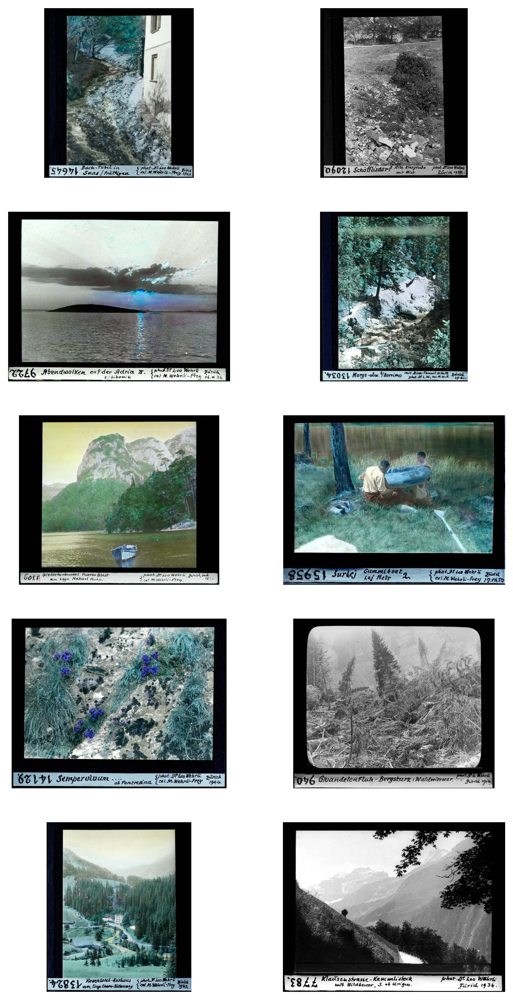

In [9]:
most_appeared_landmark_label_id = occur[0][0]
image_ids = list(df[df["landmark_id"] == most_appeared_landmark_label_id].id)
show_images(image_ids)

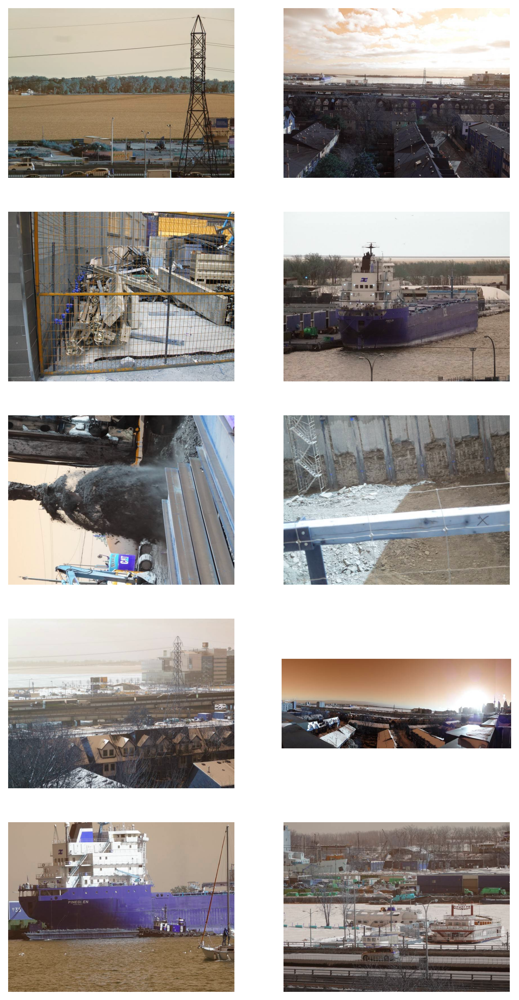

In [10]:
most_appeared_landmark_label_id = occur[1][0]
image_ids = list(df[df["landmark_id"] == most_appeared_landmark_label_id].id)
show_images(image_ids)